Tutorial - Part #4 - Image Subtraction (Transients included)
=====================

For image subtraction the package has a module called `propersubtract`, which implements a main `diff` function.


In [1]:
from copy import copy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy import stats
%matplotlib inline

In [2]:
from astropy.visualization import LinearStretch, LogStretch
from astropy.visualization import ZScaleInterval, MinMaxInterval
from astropy.visualization import ImageNormalize

In [3]:
import os
plots_path = './plots_properimage/secondimage'
if not os.path.exists(plots_path):
    os.makedirs(plots_path)

In [4]:
palette = copy(plt.cm.gray)
palette.set_bad('r', 1.0)
#palette.set_under('r', 1.0)
#palette.set_over('r', 1.0)

In [5]:
import properimage.single_image as si
import properimage.propersubtract as ps

using numpy fft API


In [6]:
import pandas as pd

(array([ 2.,  8., 10., 28., 28., 41., 29., 24.,  8.,  2.]),
 array([14.86336552, 15.85263244, 16.84189935, 17.83116626, 18.82043318,
        19.80970009, 20.79896701, 21.78823392, 22.77750083, 23.76676775,
        24.75603466]),
 <a list of 10 Patch objects>)

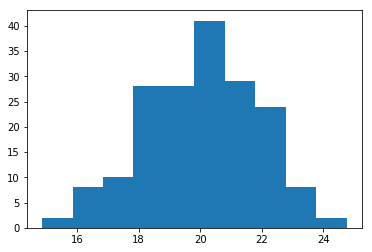

In [6]:
import pandas as pd
transients = pd.read_csv('/home/bruno/Data/RBpipeline/output_docker/QkvBW7sYuL7AsXz5dMgSuP/cats/transient.list',
                         names=['code', 'x', 'y', 'mag'], sep=' ').dropna()
plt.hist(transients['mag'].values)

In [8]:
ref_path = './../../../data/ref.fits.fz'
new_path = './../../../data/new.fits.fz'

To get the subtraction we need to run this function by using both paths for example:

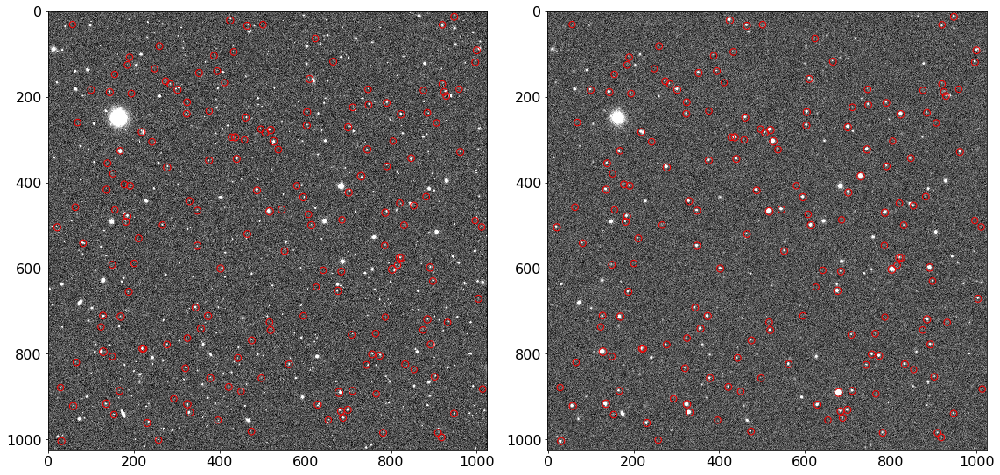

In [9]:
from astropy.io.fits import getdata

plt.figure(figsize=(16, 8))
plt.subplot(121)
ref = getdata(ref_path)
norm = ImageNormalize(ref, interval=ZScaleInterval(),
                      stretch=LinearStretch())
plt.imshow(ref, cmap=plt.cm.gray, norm=norm, interpolation='none')
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal')
#plt.grid()

plt.subplot(122)
ref = getdata(new_path)
norm = ImageNormalize(ref, interval=ZScaleInterval(),
                      stretch=LinearStretch())
plt.imshow(ref, cmap=plt.cm.gray, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
#plt.grid()
#plt.colorbar(orientation='horizontal')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'pair_of_images.png'))

In [10]:
result = ps.diff(ref=ref_path, new=new_path, smooth_psf=False, fitted_psf=True,
                 align=False, iterative=False, beta=False, shift=False)

using single psf, gaussian modeled
Sources found = 70
stamps will be 13 x 13
Sources found = 47
stamps will be 15 x 15
(47, 47, 70)
Matching result::  IDs > 0. => 2
p=2, q=2
[4.96276816 4.28597561]
('Masked pixels: ', 0)
updating stamp shape to (19,19)
('Masked pixels: ', 15)


/home/bruno/.virtualenvs/iPTF/local/lib/python2.7/site-packages/astropy/convolution/convolve.py:673: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  bigarray[arrayslices] = array
/home/bruno/.virtualenvs/iPTF/local/lib/python2.7/site-packages/astropy/convolution/convolve.py:679: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  bigkernel[kernslices] = normalized_kernel
/home/bruno/.virtualenvs/iPTF/local/lib/python2.7/site-packages/astropy/convolution/convolve.py:695: FutureWarning: Using a non-tuple sequence for multidimensional indexing is de

updating stamp shape to (21,21)
S_corr sigma_clipped_stats 
mean = -1.69556475423e-05, median = -1.52325194194e-05, std = 0.000221217433457

Subtraction performed in 21.5747070312 seconds




The result is a list of numpy arrays.

The arrays are in order: `D, P, Scorr, mask`

In [11]:
D = result[0]
P = result[1]
Scorr = result[2]
mask = result[3]

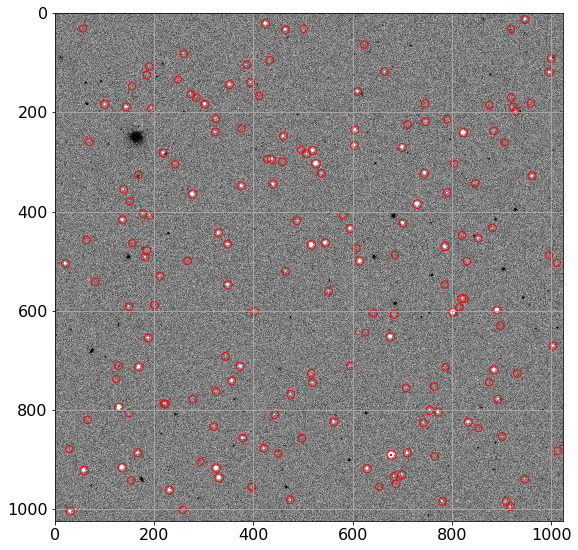

In [12]:
norm = ImageNormalize(D.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(D.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.grid()
#plt.colorbar(orientation='horizontal', shrink=0.6).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'diff1.png'))

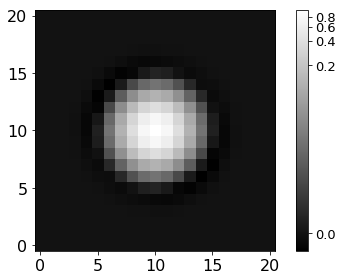

In [13]:
norm = ImageNormalize(P, interval=MinMaxInterval(),
                      stretch=LogStretch())
xc, yc = np.where(P==P.max())
xc, yc = np.round(xc[0]), np.round(yc[0])
P2 = np.roll(P, (-xc, -yc), axis=[0,1])
P2 = np.roll(P2, (10, 10), axis=[0,1])[0:21, 0:21]
plt.imshow(P2, norm=norm,
           cmap=palette, interpolation='none', 
           origin='lower')
plt.tick_params(labelsize=16)
plt.colorbar().ax.tick_params(labelsize=13)
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'psf_diff1.png'))

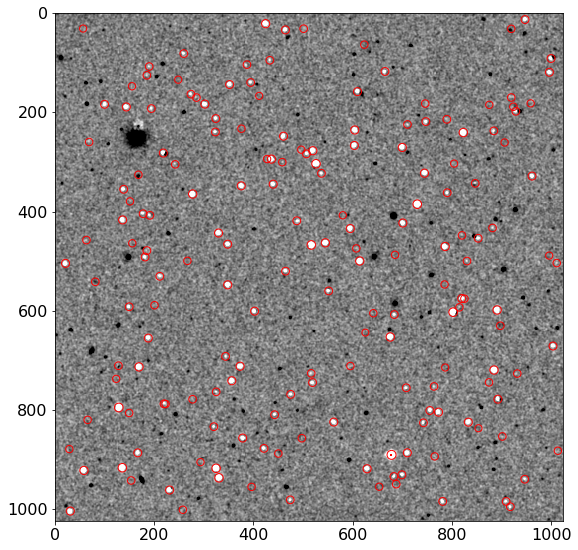

In [14]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(Scorr, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'scorr_diff1.png'))

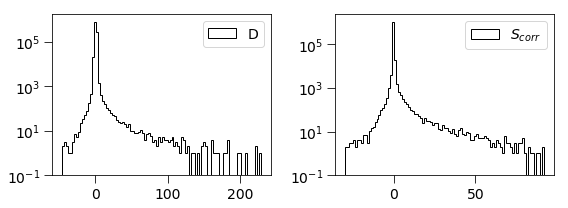

In [15]:
plt.figure(figsize=(8, 3))
dimg = np.ma.MaskedArray(D.real, mask=mask).filled(0).flatten()
plt.subplot(121)
plt.hist(dimg, log=True, bins=100, histtype='step', label='D', color='k')
#plt.xlim(-10, 10)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(dimg))
#print(stats.skewtest(dimg))

plt.subplot(122)
simage = np.ma.MaskedArray(Scorr.real, mask=mask).filled(0).flatten()
plt.hist(simage/np.std(simage), log=True, bins=100, histtype='step', label=r'$S_{corr}$', color='k')
#plt.xlim(-4, 4)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(simage))
#print(stats.skewtest(simage))
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'hists_diff1.png'))

This is related to the quantities derived in Zackay et al. works. 
$S_{corr} = P_D \otimes D$

In [16]:
reload(ps)

using pyfftw interfaces API


<module 'properimage.propersubtract' from '/home/bruno/Devel/zackay_code/properimage/properimage/propersubtract.pyc'>

In [17]:
D, P, Scorr, mask = ps.diff(ref=ref_path, new=new_path, align=False,
                            beta=True, iterative=False, shift=False )

using single psf, gaussian modeled
Sources found = 70
stamps will be 13 x 13
Sources found = 47
stamps will be 15 x 15
(47, 47, 70)
Matching result::  IDs > 0. => 2
p=2, q=2
[4.96276816 4.28597561]
('Masked pixels: ', 0)
updating stamp shape to (19,19)
('Masked pixels: ', 15)
updating stamp shape to (21,21)
Found that beta = [0.57833678]
Took only 4.12938499451 awesome seconds
The solution was with cost 3.93887538049e+11
S_corr sigma_clipped_stats 
mean = -4.90361833148e-06, median = -7.0653252748e-06, std = 0.000140704528305

Subtraction performed in 17.0423178673 seconds




The result is a list of numpy arrays.

The arrays are in order: `D, P, Scorr, mask`

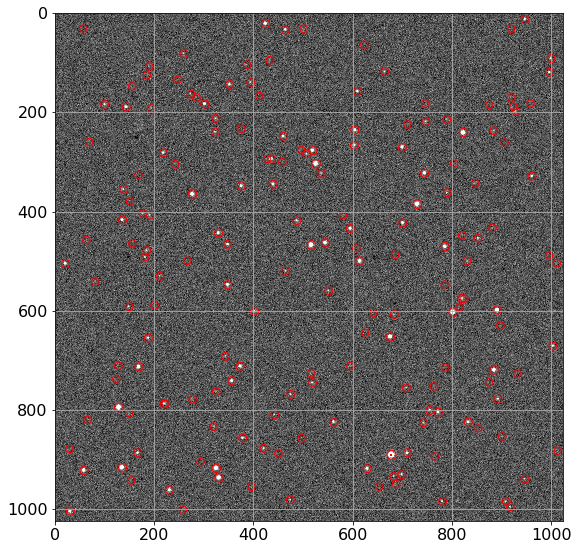

In [18]:
norm = ImageNormalize(D.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(D.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.grid()
#plt.colorbar(orientation='horizontal', shrink=0.6).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'diff_beta.png'))

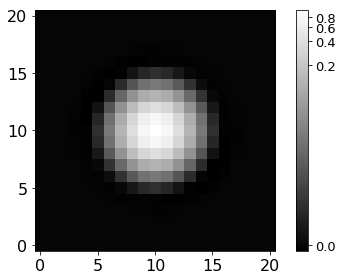

In [19]:
norm = ImageNormalize(P, interval=MinMaxInterval(),
                      stretch=LogStretch())
xc, yc = np.where(P==P.max())
xc, yc = np.round(xc[0]), np.round(yc[0])
P2 = np.roll(P, (-xc, -yc), axis=[0,1])
P2 = np.roll(P2, (10, 10), axis=[0,1])[0:21, 0:21]
plt.imshow(P2, norm=norm,
           cmap=palette, interpolation='none', 
           origin='lower')
plt.tick_params(labelsize=16)
plt.colorbar().ax.tick_params(labelsize=13)

plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'psf_diff_beta.png'))

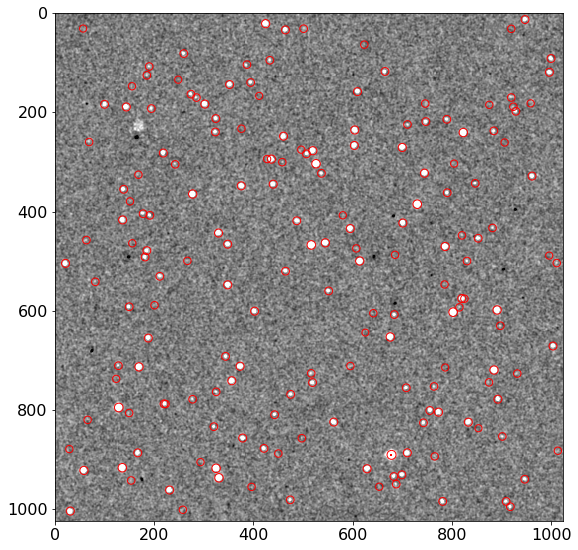

In [20]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(Scorr, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'scorr_diff_beta.png'))

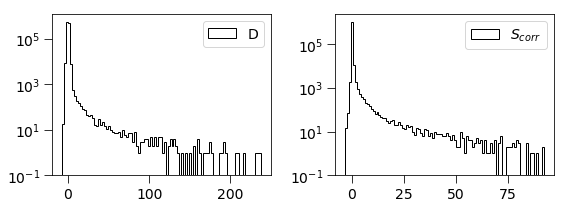

In [21]:
plt.figure(figsize=(8, 3))
dimg = np.ma.MaskedArray(D.real, mask=mask).filled(0).flatten()
plt.subplot(121)
plt.hist(dimg, log=True, bins=100, histtype='step', label='D', color='k')
#plt.xlim(-10, 10)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(dimg))
#print(stats.skewtest(dimg))

plt.subplot(122)
simage = np.ma.MaskedArray(Scorr.real, mask=mask).filled(0).flatten()
plt.hist(simage/np.std(simage), log=True, bins=100, histtype='step', label=r'$S_{corr}$', color='k')
#plt.xlim(-4, 4)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(simage))
#print(stats.skewtest(simage))
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'hists_diff_beta.png'))

We have the option of using the iterative methods without beta

In [22]:
reload(ps)

using pyfftw interfaces API


<module 'properimage.propersubtract' from '/home/bruno/Devel/zackay_code/properimage/properimage/propersubtract.pyc'>

In [23]:
D, P, Scorr, mask = ps.diff(ref=ref_path, new=new_path, align=False, beta=True, iterative=True, shift=False)

using single psf, gaussian modeled
Sources found = 70
stamps will be 13 x 13
Sources found = 47
stamps will be 15 x 15
(47, 47, 70)
Matching result::  IDs > 0. => 2
p=2, q=2
[4.96276816 4.28597561]
('Masked pixels: ', 0)
updating stamp shape to (19,19)
('Masked pixels: ', 15)
updating stamp shape to (21,21)
Found that beta = 0.578334994066
Took only 0.0 awesome seconds
S_corr sigma_clipped_stats 
mean = -4.90350373422e-06, median = -7.0650782769e-06, std = 0.000140704040401

Subtraction performed in 17.0031530857 seconds




The result is a list of numpy arrays.

The arrays are in order: `D, P, Scorr, mask`

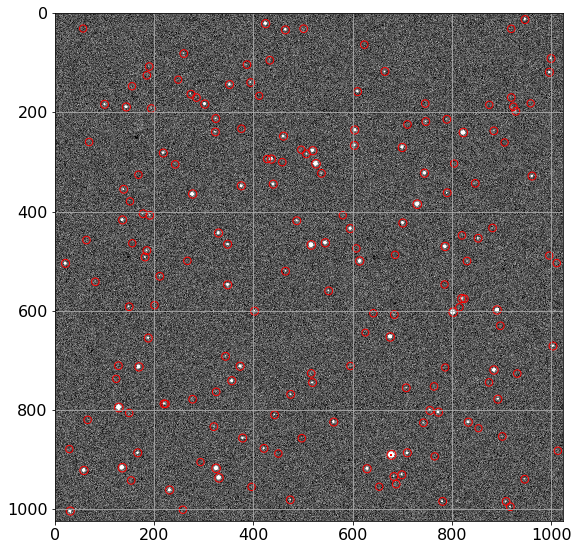

In [24]:
norm = ImageNormalize(D.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(D.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.grid()
#plt.colorbar(orientation='horizontal', shrink=0.6).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'diff_beta_iter.png'))

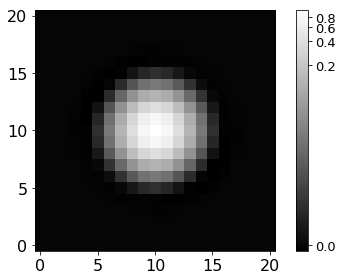

In [25]:
norm = ImageNormalize(P, interval=MinMaxInterval(),
                      stretch=LogStretch())
xc, yc = np.where(P==P.max())
xc, yc = np.round(xc[0]), np.round(yc[0])
P2 = np.roll(P, (-xc, -yc), axis=[0,1])
P2 = np.roll(P2, (10, 10), axis=[0,1])[0:21, 0:21]
plt.imshow(P2, norm=norm,
           cmap=palette, interpolation='none', 
           origin='lower')
plt.tick_params(labelsize=16)
plt.colorbar().ax.tick_params(labelsize=13)
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'psf_diff_beta_iter.png'))

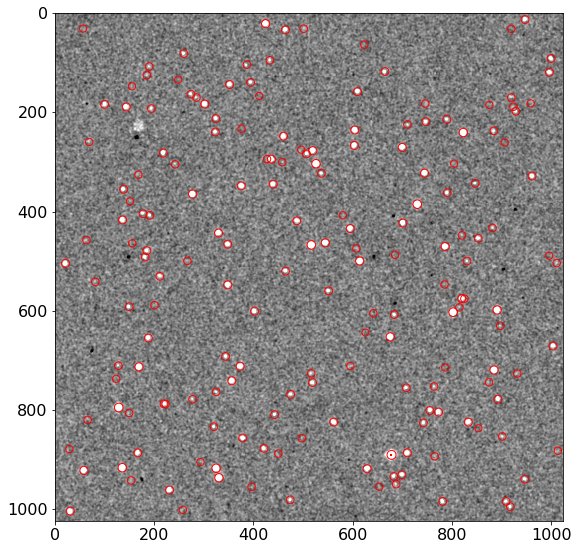

In [26]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(Scorr, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'scorr_diff_beta_iter.png'))

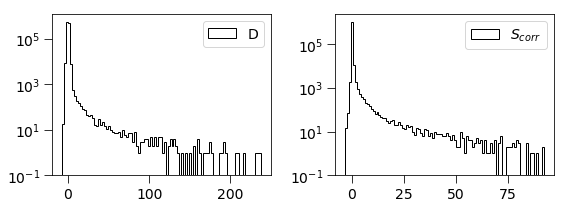

In [27]:
plt.figure(figsize=(8, 3))
dimg = np.ma.MaskedArray(D.real, mask=mask).filled(0).flatten()
plt.subplot(121)
plt.hist(dimg, log=True, bins=100, histtype='step', label='D', color='k')
#plt.xlim(-10, 10)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(dimg))
#print(stats.skewtest(dimg))

plt.subplot(122)
simage = np.ma.MaskedArray(Scorr.real, mask=mask).filled(0).flatten()
plt.hist(simage/np.std(simage), log=True, bins=100, histtype='step', label=r'$S_{corr}$', color='k')
#plt.xlim(-4, 4)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(simage))
#print(stats.skewtest(simage))
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'hists_diff_beta_iter.png'))

We have the option of using the iterative methods without beta

In [28]:
reload(ps)

using pyfftw interfaces API


<module 'properimage.propersubtract' from '/home/bruno/Devel/zackay_code/properimage/properimage/propersubtract.pyc'>

In [29]:
D, P, Scorr, mask = ps.diff(ref=ref_path, new=new_path, smooth_psf=False, fitted_psf=True,
                            align=False, iterative=False, beta=True, shift=True)

using single psf, gaussian modeled
Sources found = 70
stamps will be 13 x 13
Sources found = 47
stamps will be 15 x 15
(47, 47, 70)
Matching result::  IDs > 0. => 2
p=2, q=2
[4.96276816 4.28597561]
('Masked pixels: ', 0)
updating stamp shape to (19,19)
('Masked pixels: ', 15)
updating stamp shape to (21,21)
Found that beta = [ 0.58698103 -0.00354815 -0.00116647]
Took only 15.5394430161 awesome seconds
The solution was with cost 0.373407237402
S_corr sigma_clipped_stats 
mean = -5.36821390642e-06, median = -7.41564816259e-06, std = 0.000143076271683

Subtraction performed in 28.3597910404 seconds




The result is a list of numpy arrays.

The arrays are in order: `D, P, Scorr, mask`

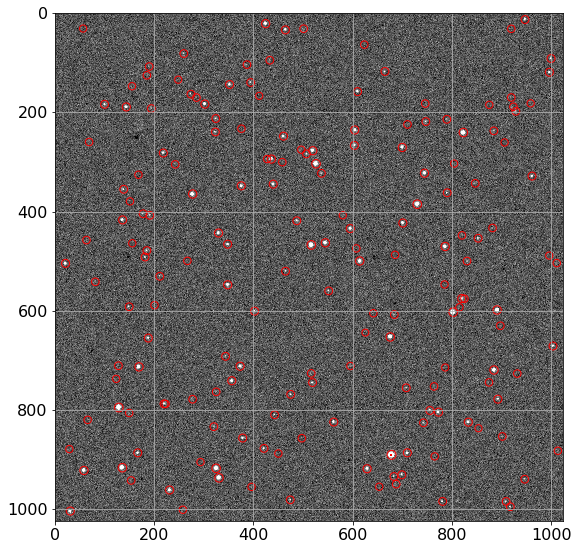

In [30]:
norm = ImageNormalize(D.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(D.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.grid()
#plt.colorbar(orientation='horizontal', shrink=0.6).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'diff_beta_shift.png'))

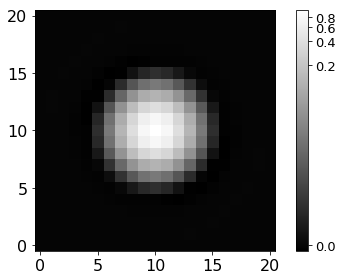

In [31]:
norm = ImageNormalize(P, interval=MinMaxInterval(),
                      stretch=LogStretch())
xc, yc = np.where(P==P.max())
xc, yc = np.round(xc[0]), np.round(yc[0])
P2 = np.roll(P, (-xc, -yc), axis=[0,1])
P2 = np.roll(P2, (10, 10), axis=[0,1])[0:21, 0:21]
plt.imshow(P2, norm=norm,
           cmap=palette, interpolation='none', 
           origin='lower')
plt.tick_params(labelsize=16)
plt.colorbar().ax.tick_params(labelsize=13)
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'psf_diff_beta_shift.png'))

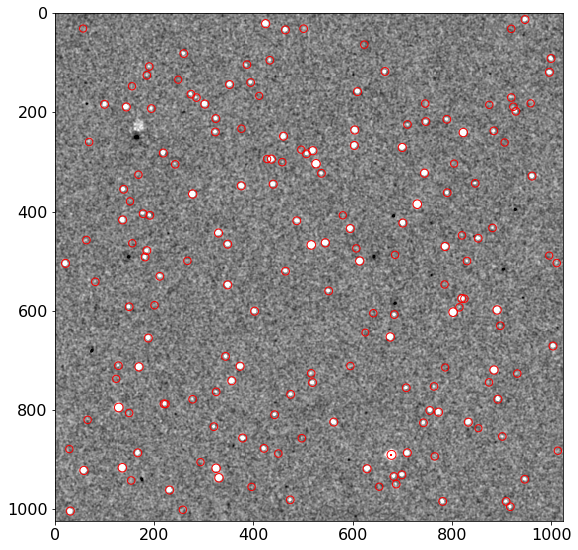

In [32]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(Scorr, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'scorr_diff_beta_shift.png'))

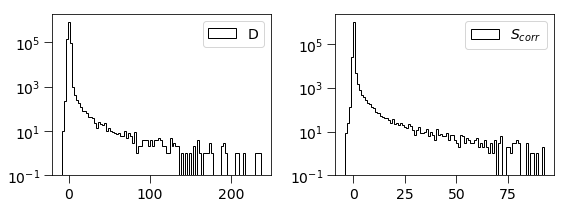

In [33]:
plt.figure(figsize=(8, 3))
dimg = np.ma.MaskedArray(D.real, mask=mask).filled(0).flatten()
plt.subplot(121)
plt.hist(dimg, log=True, bins=100, histtype='step', label='D', color='k')
#plt.xlim(-10, 10)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(dimg))
#print(stats.skewtest(dimg))

plt.subplot(122)
simage = np.ma.MaskedArray(Scorr.real, mask=mask).filled(0).flatten()
plt.hist(simage/np.std(simage), log=True, bins=100, histtype='step', label=r'$S_{corr}$', color='k')
#plt.xlim(-4, 4)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(simage))
#print(stats.skewtest(simage))
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'hists_diff_beta_shift.png'))

In [34]:
reload(ps)

using pyfftw interfaces API


<module 'properimage.propersubtract' from '/home/bruno/Devel/zackay_code/properimage/properimage/propersubtract.pyc'>

In [35]:
D, P, Scorr, mask = ps.diff(ref=ref_path, new=new_path, smooth_psf=False, fitted_psf=True,
                            align=False, iterative=False, beta=False, shift=True)

using single psf, gaussian modeled
Sources found = 70
stamps will be 13 x 13
Sources found = 47
stamps will be 15 x 15
(47, 47, 70)
Matching result::  IDs > 0. => 2
p=2, q=2
[4.96276816 4.28597561]
('Masked pixels: ', 0)
updating stamp shape to (19,19)
('Masked pixels: ', 15)
updating stamp shape to (21,21)
Found that shift = [-0.06459464  0.01011278]
Took only 3.24429416656 awesome seconds
The solution was with cost 0.379769061753
S_corr sigma_clipped_stats 
mean = -1.69624684048e-05, median = -1.52316754871e-05, std = 0.00022121519792

Subtraction performed in 16.4406399727 seconds




The result is a list of numpy arrays.

The arrays are in order: `D, P, Scorr, mask`

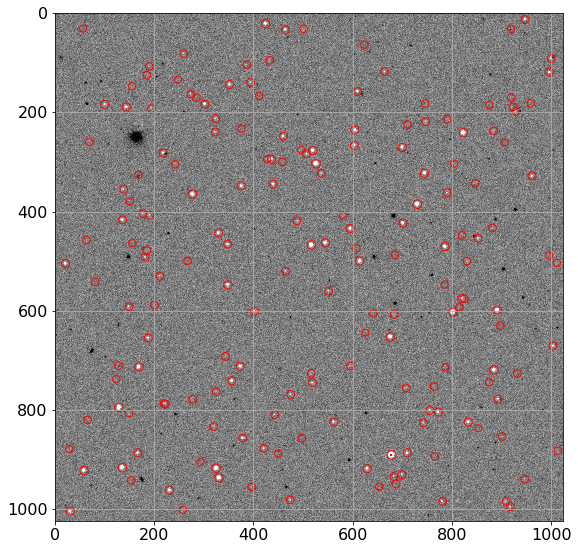

In [36]:
norm = ImageNormalize(D.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(D.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.grid()
#plt.colorbar(orientation='horizontal', shrink=0.6).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'diff_shift.png'))

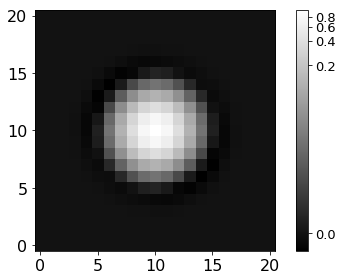

In [37]:
norm = ImageNormalize(P, interval=MinMaxInterval(),
                      stretch=LogStretch())
xc, yc = np.where(P==P.max())
xc, yc = np.round(xc[0]), np.round(yc[0])
P2 = np.roll(P, (-xc, -yc), axis=[0,1])
P2 = np.roll(P2, (10, 10), axis=[0,1])[0:21, 0:21]
plt.imshow(P2, norm=norm,
           cmap=palette, interpolation='none', 
           origin='lower')
plt.tick_params(labelsize=16)
plt.colorbar().ax.tick_params(labelsize=13)
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'psf_diff_shift.png'))

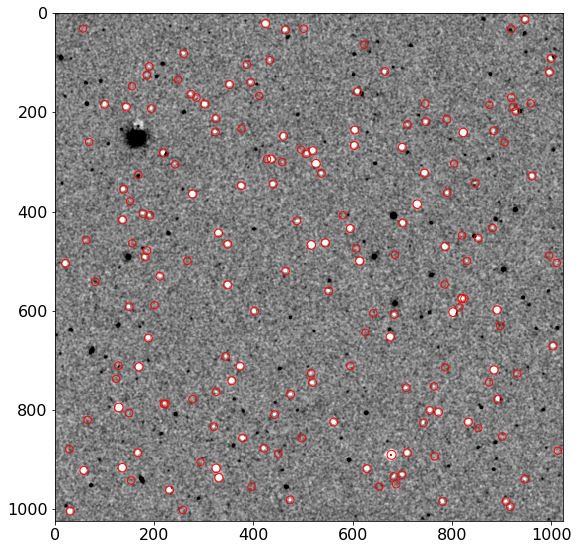

In [38]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(Scorr, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'scorr_diff_shift.png'))

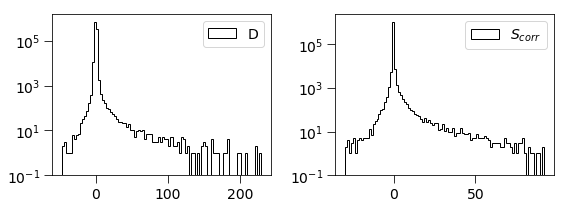

In [39]:
plt.figure(figsize=(8, 3))
dimg = np.ma.MaskedArray(D.real, mask=mask).filled(0).flatten()
plt.subplot(121)
plt.hist(dimg, log=True, bins=100, histtype='step', label='D', color='k')
#plt.xlim(-10, 10)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(dimg))
#print(stats.skewtest(dimg))

plt.subplot(122)
simage = np.ma.MaskedArray(Scorr.real, mask=mask).filled(0).flatten()
plt.hist(simage/np.std(simage), log=True, bins=100, histtype='step', label=r'$S_{corr}$', color='k')
#plt.xlim(-4, 4)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(simage))
#print(stats.skewtest(simage))
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'hists_diff_shift.png'))

In [40]:
reload(ps)

using pyfftw interfaces API


<module 'properimage.propersubtract' from '/home/bruno/Devel/zackay_code/properimage/properimage/propersubtract.pyc'>

In [41]:
D, P, Scorr, mask = ps.diff(ref=ref_path, new=new_path, smooth_psf=False, fitted_psf=False,
                            align=False, iterative=False, beta=True, shift=True)

Sources found = 70
stamps will be 13 x 13
Sources found = 47
stamps will be 15 x 15
(47, 47, 70)
Matching result::  IDs > 0. => 2
p=2, q=2
[4.96276816 4.28597561]
('Masked pixels: ', 0)
updating stamp shape to (19,19)
((70, 70), (361, 70))
('Masked pixels: ', 15)
updating stamp shape to (21,21)
((47, 47), (441, 47))


/home/bruno/.virtualenvs/iPTF/local/lib/python2.7/site-packages/pyfftw/builders/_utils.py:161: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  a_copy[update_input_array_slicer])


Found that beta = [ 1.02300775 -0.04364112 -0.05419985]
Took only 63.0256829262 awesome seconds
The solution was with cost 0.375253042986
S_corr sigma_clipped_stats 
mean = -8.62959298072e-06, median = -1.51470748508e-05, std = 0.000259591373754

Subtraction performed in 70.4646570683 seconds




The result is a list of numpy arrays.

The arrays are in order: `D, P, Scorr, mask`

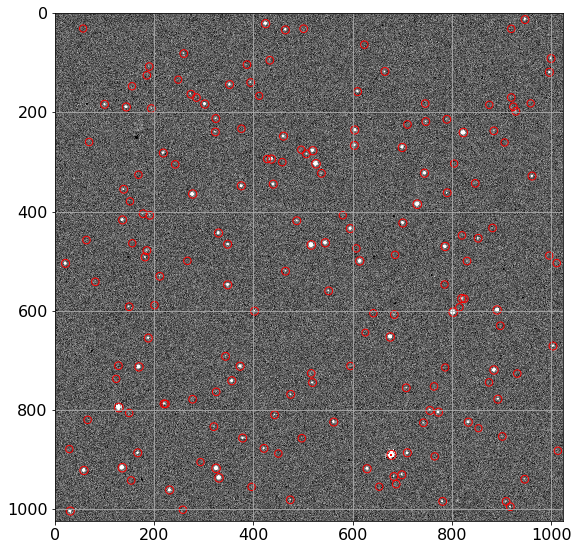

In [42]:
norm = ImageNormalize(D.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(D.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.grid()
#plt.colorbar(orientation='horizontal', shrink=0.6).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'diff_beta_shift_kl.png'))

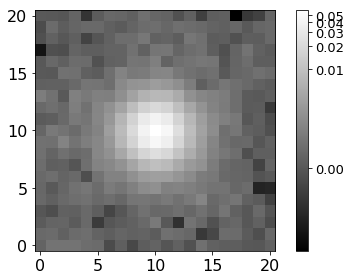

In [43]:
norm = ImageNormalize(P, interval=MinMaxInterval(),
                      stretch=LogStretch())
xc, yc = np.where(P==P.max())
xc, yc = np.round(xc[0]), np.round(yc[0])
P2 = np.roll(P, (-xc, -yc), axis=[0,1])
P2 = np.roll(P2, (10, 10), axis=[0,1])[0:21, 0:21]
plt.imshow(P2, norm=norm,
           cmap=palette, interpolation='none', 
           origin='lower')
plt.tick_params(labelsize=16)
plt.colorbar().ax.tick_params(labelsize=13)
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'psf_diff_beta_shift_kl.png'))

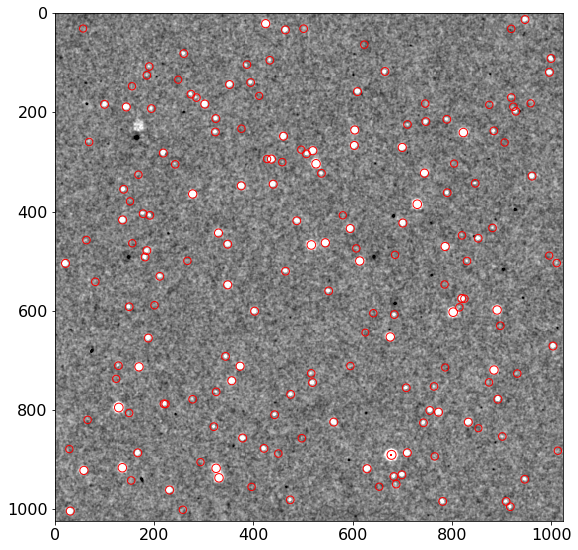

In [44]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(8, 8))
plt.imshow(np.ma.MaskedArray(Scorr, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'scorr_diff_beta_shift_kl.png'))

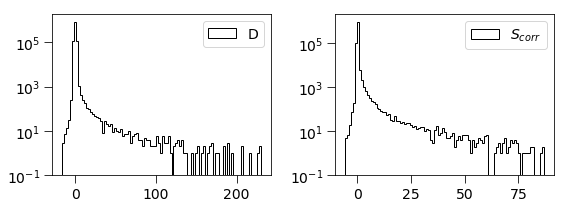

In [45]:
plt.figure(figsize=(8, 3))
dimg = np.ma.MaskedArray(D.real, mask=mask).filled(0).flatten()
plt.subplot(121)
plt.hist(dimg, log=True, bins=100, histtype='step', label='D', color='k')
#plt.xlim(-10, 10)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(dimg))
#print(stats.skewtest(dimg))

plt.subplot(122)
simage = np.ma.MaskedArray(Scorr.real, mask=mask).filled(0).flatten()
plt.hist(simage/np.std(simage), log=True, bins=100, histtype='step', label=r'$S_{corr}$', color='k')
#plt.xlim(-4, 4)
plt.tick_params(labelsize=14)
plt.tick_params(size=8)
plt.legend(fontsize=14)
#plt.show()
#print(stats.skew(simage))
#print(stats.skewtest(simage))
plt.tight_layout()
plt.savefig(os.path.join(plots_path, 'hists_diff_beta_shift_kl.png'))

In [50]:
from properimage import utils

In [51]:
catlow = pd.DataFrame(utils.find_S_local_maxima(Scorr.real, threshold=2.5), columns=['x', 'y', 'signif'])
cathig = pd.DataFrame(utils.find_S_local_maxima(Scorr.real, threshold=10, neighborhood_size=9), columns=['x', 'y', 'signif'])

In [52]:
cat = pd.concat([catlow, cathig]).drop_duplicates()

In [53]:
len(cat)

1420

In [54]:
cat = pd.DataFrame(cat, columns=['x', 'y', 'signif'])

In [55]:
ids = utils.matching(transients, cat, radius=1.8)

(1420, 1420, 180)
Matching result::  IDs > 0. => 128


In [56]:
cat.columns

Index([u'x', u'y', u'signif'], dtype='object')

In [57]:
transients.columns

Index([u'code', u'x', u'y', u'mag', u'masterindex'], dtype='object')

In [58]:
cat['tx'] = -1
cat['ty'] = -1
cat['masterindex'] = -1
cat['tmag'] = -1

for irow, row in cat.iterrows():
    if ids[irow]>-1:
        tt = transients.iloc[transients.masterindex.values == ids[irow]]
    
        cat.loc[irow, 'tx'] = tt['x'].values[0]
        cat.loc[irow, 'ty'] = tt['y'].values[0]
        cat.loc[irow, 'masterindex'] = tt['masterindex'].values[0]
        cat.loc[irow, 'tmag'] = tt['mag'].values[0]

(0, 30)

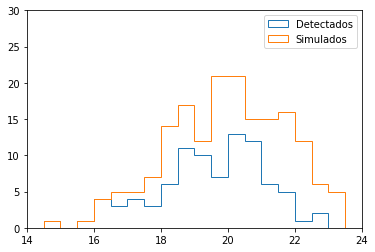

In [59]:
bins=np.arange(14, 24, 0.5)
plt.hist(cat['tmag'], bins=bins, histtype='step', label='Detectados')
plt.hist(transients['mag'], bins=bins, histtype='step', label='Simulados')
plt.legend(loc='best')
plt.xlim(14, 24)
plt.ylim(0, 30)

/home/bruno/.virtualenvs/iPTF/local/lib/python2.7/site-packages/matplotlib/collections.py:853: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


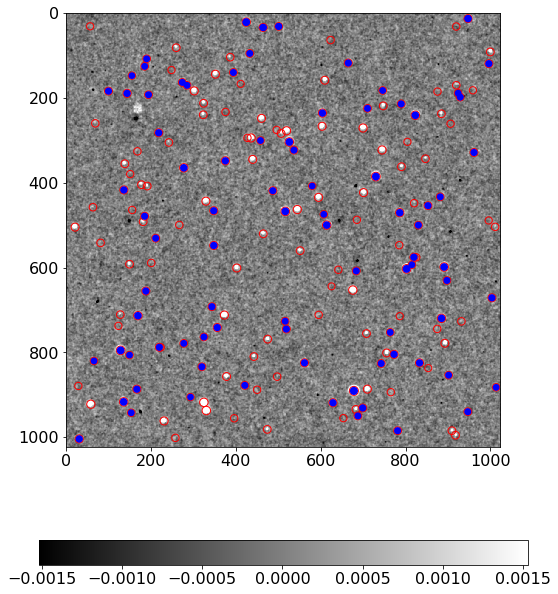

In [60]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(10, 9))
plt.imshow(np.ma.MaskedArray(Scorr.real, mask=mask), 
           cmap=palette, norm=norm, interpolation='none')
plt.tick_params(labelsize=16)
plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
plt.scatter(cat['tx'], cat['ty'], s=1000/cat['tmag'], facecolor='b', edgecolors='none')
plt.tight_layout()
#plt.savefig(os.path.join(plots_path, 'scorr_diff_beta_shift_kl.png'))

In [61]:
sstd = np.std(Scorr.real)

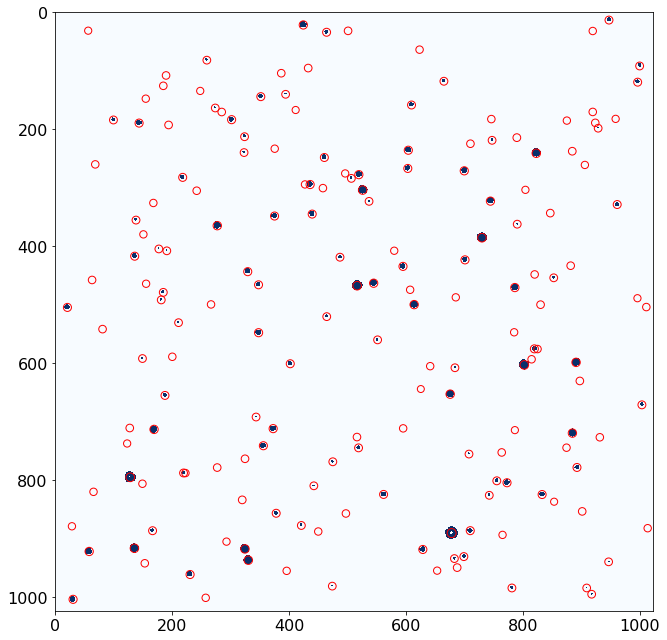

In [62]:
norm = ImageNormalize(Scorr.real, interval=ZScaleInterval(),
                      stretch=LinearStretch())

plt.figure(figsize=(10, 9))
plt.imshow(np.ma.MaskedArray(Scorr.real, mask=mask)>1.5*sstd, 
           cmap='Blues', interpolation='none')
plt.tick_params(labelsize=16)
#plt.colorbar(orientation='horizontal', shrink=0.7).ax.tick_params(labelsize=16)
plt.scatter(transients['x'], transients['y'], s=1200/transients['mag'], facecolor='none', edgecolors='r')
#plt.scatter(cat['tx'], cat['ty'], s=1000/cat['tmag'], facecolor='b', edgecolors='none')
plt.tight_layout()
#plt.savefig(os.path.join(plots_path, 'scorr_diff_beta_shift_kl.png'))